# Steam web scraping and analysis

This is my latest project. I set out to scrape data from steam and analyze the pertinent information in order visualize some market tendencies as well as some details I find interesting. To collect the data, I wrote a script using BeautifulSoup, a python package for parsing HTML. Once collected, the information was handled using pandas, a notorious python data analysis and manipulation tool.
This document starts with the script for extracting data, and then we move on to the analysis part. All necessary code is written here, and everything was done in Python.

## Table of Contents
* [Data scraping](#data_scraping)
    * [Pertinent packages](#packages)
    * [Handle requests errors](#handle_requests_errors)
    * [Extracting product information](#product_info)
    * [Saving data do csv](#csv_save)
    * [Getting list of games from desired URL](#url_list)
    * [Choosing the amount of games to be scraped and starting the process](#start_scrape)
* [Data analysis](#data_analysis)
    * [Manipulating the output](#output_manip)
    * [Steam's most popular games](#popular_games)
    * [Best and worst big developers](#devs)
    * [Best and worst big publishers](#pubs)
    * [Most played genres](#genres)
    * [Steam's released games along the years](#year_releases)
    * [The impact innovative games have on the industry](#dark_souls)
        * [Try it yourself](#tiy)
    * [A player's perspective vs. a critics'](#pvc)
    * [Best and worst games](#games)


## Data scraping <a class="anchor" id="data_scraping"></a>

### Pertinent packages <a class="anchor" id="packages"></a>

We start by importing the necessary packages for this project:

In [6]:
import requests
import pandas as pd
import re
import time
import numpy as np
from bs4 import BeautifulSoup
from ast import literal_eval
import matplotlib.pyplot as plt
from datetime import datetime
import plotly.graph_objs as go
from datetime import timedelta
from matplotlib.font_manager import FontProperties
import plotly
plotly.offline.init_notebook_mode()

### Handle requests errors <a class="anchor" id="handle_requests_errors"></a>

This next cell handles requests errors. These may happen due to server issues, but these are promptly addressed

In [68]:
MAX_RETRIES = 10

def try_request(url):
    for _ in range(MAX_RETRIES):
        try:
            response = requests.get(url)
            if response.status_code == 200:
                return response
            else:
                print(f'Error fetching url: {response.status_code}')
                time.sleep(5)
        except requests.exceptions.RequestException as e:
            print(f"Failed to fetch link. Error: {e}")
            time.sleep(20)
            continue
    return None

### Extracting product information <a class="anchor" id="product_info"></a>

This next cell receives an HTML file of a game and extracts the desired information. This HTML originates from a general page containing multiple games. Certain information is extracted directly from this main page, while additional details are scraped by following the URL to the specific game page. For example, each game's release date shown on the main page tends to correspond to its release date on the Steam platform, whereas the release date information found on the individual game page corresponds to the release date of the game itself. Some other information can be a bit trickier. Pricing, for instance, may sometimes show up on the initial page and sometimes not, while the HTML tags for prices on the game page may be inconsistent.


In [81]:
def extract_text(element):
    return element.text.strip() if element else None

def get_price(soup, game_page_flag=False):
    price = None
    discount_original_price_elements = soup.select_one('div.discount_original_price')

    if discount_original_price_elements:
        price = extract_text(discount_original_price_elements)

    if not price:
        if game_page_flag:
            price = extract_text(soup.select_one('div.game_purchase_price'))
        else:
            price = extract_text(soup.select_one('div.discount_final_price'))
    
    return price

def extract_product_info(game_html):

    # Extract app_name from first page
    app_name = extract_text(game_html.find('span', {'class': 'title'}))

    # Date from first page
    release_date = extract_text(game_html.select_one('div.col.search_released.responsive_secondrow'))

    url = game_html['href']
    response = try_request(url)

    if response is None:
        print(f"Max retries exceeded for URL {url}. Skipping...")
        return None

    soup = BeautifulSoup(response.text, 'html.parser')


    # Extract price
    # Try from first page
    price = get_price(game_html, game_page_flag=False)
    # If it fails, try to get it from the product page
    if not price:
        price = get_price(soup, game_page_flag=True)
    

    # Extract specs
    specs = [extract_text(spec) for spec in soup.select('.game_area_details_specs_ctn div.label')][:3]

    # Extract tags
    tags = [extract_text(tag) for tag in soup.select('.popular_tags a')][:5]

    # Extract metascore  
    metascore = extract_text(soup.find('div', {'class': 'score'}))

    #Extracts the positive review percentage and number of reviews
    review_elements = soup.select('span.nonresponsive_hidden')
    positive_percent = number_of_reviews = None

    if review_elements:
        review_text = review_elements[-1].get_text(strip=True).replace(',', '')
        reviews_and_percent = re.findall(r'\d+', review_text)
        
        if len(reviews_and_percent) >= 2:
            positive_percent = reviews_and_percent[0] 
            number_of_reviews = reviews_and_percent[1]     

    # Extract developers and publishers  
    find_dev_row = soup.find_all('div', class_='dev_row')
    developer = extract_text(find_dev_row[0].find('div', class_='summary')) if find_dev_row else None
    publisher = extract_text(find_dev_row[1].find('div', class_='summary')) if len(find_dev_row) > 1 else None

    return {
            'app_name':app_name,
            'specs': specs,
            'tags': tags,
            'metascore': metascore,
            'number_of_reviews': number_of_reviews,
            'positive_percent': positive_percent,
            'release_date': release_date,
            'price': price,
            'developer' : developer,
            'publisher' : publisher
    }

### Saving data to csv <a class="anchor" id="csv_save"></a>

In [71]:
def save_to_csv(data):
    pd.DataFrame(data).to_csv('products.csv', index=False)

### Getting list of games from desired URL <a class="anchor" id="url_list"></a>

This next cell receives the URL from an initial page, and it extracts a list of games in HTML format. This initial page displays games sorted by popularity, with DLCs and game bundles filtered out. Once all 50 games from this page are scraped, the URL is automatically updated to navigate to the next page with an additional 50 games, and this process continues iteratively."

In [77]:
def scrape_steam_store_pages(number_of_games):
    results = []

    for x in range(0, number_of_games, 50):
        url = f'https://store.steampowered.com/search/results/?query=&start={x}&count=50&dynamic_data=&sort_by=_ASC&category1=998&snr=1_7_7_230_7&infinite=1'
    
        response = try_request(url)    
        data = response.json()['results_html']
        soup = BeautifulSoup(data, 'html.parser')

        # links = [a['href'] for a in soup.find_all('a')]

        games_list = soup.find_all('a')

        for game in games_list:
            new_entry = extract_product_info(game)
            results.append(new_entry)

        print(f'{x+50} games scraped')
    
    print(len(results))   
    save_to_csv(results)

### Choosing the amount of games to be scraped and starting the process <a class="anchor" id="start_scrape"></a>

In [ ]:
#Start scraping
scrape_steam_store_pages(number_of_games=50000)

## Data analysis <a class="anchor" id="data_analysis"></a>

### Manipulating the output <a class="anchor" id="output_manip"></a>

Once the scraping is complete, we start by manipulating the output

In [2]:

df = pd.read_csv('50kproducts.csv')

# Cleaning duplicates. This happens when the most popular pages on steam update mid scraping
df = df.drop_duplicates().reset_index()

# Filter out messy pages + games with less than 50 reviews
df = df[(~df['number_of_reviews'].isna()) & (~df['app_name'].isna()) & (~df['price'].isna()) & (df['number_of_reviews'] >= 50)].reset_index(drop=True)

# New year of release column
df['release_year'] = pd.to_datetime(df['release_date']).dt.strftime('%Y')
df['release_date'] = pd.to_datetime(df['release_date'])

# New number of positive reviews
df['numberof_positive_reviews'] = df['positive_percent']*df['number_of_reviews']

# Transforming column types
df['tags'] = df['tags'].apply(literal_eval)
df['price'] = df['price'].replace('\.', '', regex=True).replace(',', '.', regex=True).replace('R\$', '', regex=True)
df['price'] = pd.to_numeric(df['price'], errors='coerce').fillna(0)
df['number_of_reviews'] = df['number_of_reviews'].astype(np.int)
df['positive_percent'] = df['positive_percent'].astype(np.int)

### Steam's most popular games <a class="anchor" id="popular_games"></a>

I start this data comprehension with a general interative plot showcasing Steam's most popular games. Specifically, only entries with at least $50$ reviews were included, and neither subscription-based games nor titles that are no longer playable are considered The plot illustrates the relationship between a game's total number of reviews and its rating. The color of each entry represents its price range, as indicated in the figure's legend. Moreover, hovering over each point with the cursor reveals additional information, such as the game's name, and its release date. Note that you can also toggle each price range on and off by clicking on its label in the legend (the prices are in R$). The y-axis is drawn in log scale in order to accommodate the vast disparity in total reviews across the dataset, ensuring clarity in visualization.

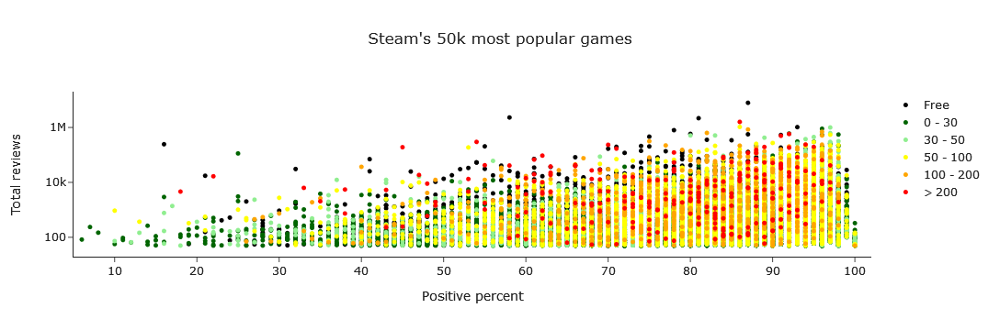

In [7]:
def price_colors(data):
    
    color_conditions = [
    (data['price'] == 0),
    (data['price'] < 30),
    (np.logical_and(data['price'] >= 30, (data['price'] < 50))),
    (np.logical_and(data['price'] >= 50, (data['price'] < 100))),
    (np.logical_and(data['price'] >= 100, (data['price'] < 200))),
    (data['price'] >= 200)
    ]

    colors = ['black', 'darkgreen', 'lightgreen', 'yellow', 'orange', 'red']

    data['colors'] = list(np.select(color_conditions, colors))
    
    return data

df = price_colors(df)

def price_trace(df, name):
    trace = go.Scatter(
        x=df['positive_percent'],
        y=df['number_of_reviews'],
        mode='markers',
        marker=dict(color=df['colors'], size=5),
        text = '<b>Game:</b> ' + df['app_name'] + \
            '<br><b>Release Date:</b> ' + df['release_date'].astype(str) + \
            '<br><b>Price: </b>' + df['price'].map('{:.2f}'.format),
        name=name,
        hoverinfo='text',
    )
    return trace

free_trace = price_trace(df[df['colors']=='black'], 'Free')
range_1st = price_trace(df[df['colors']=='darkgreen'], '0 - 30')
range_2nd = price_trace(df[df['colors']=='lightgreen'], '30 - 50')
range_3rd = price_trace(df[df['colors']=='yellow'], '50 - 100')
range_4th = price_trace(df[df['colors']=='orange'], '100 - 200')
range_5th = price_trace(df[df['colors']=='red'], '> 200')


# Create Plotly layout
layout = go.Layout(
    title=dict(text="Steam's 50k most popular games", y=0.9, x=0.5),
    xaxis=dict(title='Positive percent', range=[5, 102]),
    yaxis=dict(title='Total reviews', type='log'),
    template='simple_white',
    hoverlabel=dict(bgcolor='white', font={'color': 'black'}),
)

# Create Plotly figure
fig = go.Figure(data=[free_trace, range_1st, range_2nd, range_3rd, range_4th, range_5th], layout=layout)

# Show Plotly figure
fig.show()

### Best and worst big developers <a class="anchor" id="devs"></a>

What is the use of making this project if it's not at least a little polemic? Here, I investigate which are the best and the worst **Developers** on steam. In order to do so, I set a few parameters. I only considered developers which have **at least** $3$ released games, with a minimum total of $100$k reviews. There is an exception, however. Blizzard currently only has $2$ released games on steam, Overwatch 2 and Diablo IV. But due to the astounding amount of negative reviews, I decided to include it anyway. Also, even though it only has $2$ games released on Steam, they have more than $200$k reviews.

Interestingly enough, the top $10$ developers list is populated with relatively smaller studios. While big companies like DICE, a subsidiary of EA, find themselves among the bottom $10$. Fun fact, if I hadn't chosen to omit games which are no longer playable, EA would manage the feat of appearing not only once, but twice as worst developer, both under DICE and as EA Canada & EA Romania.

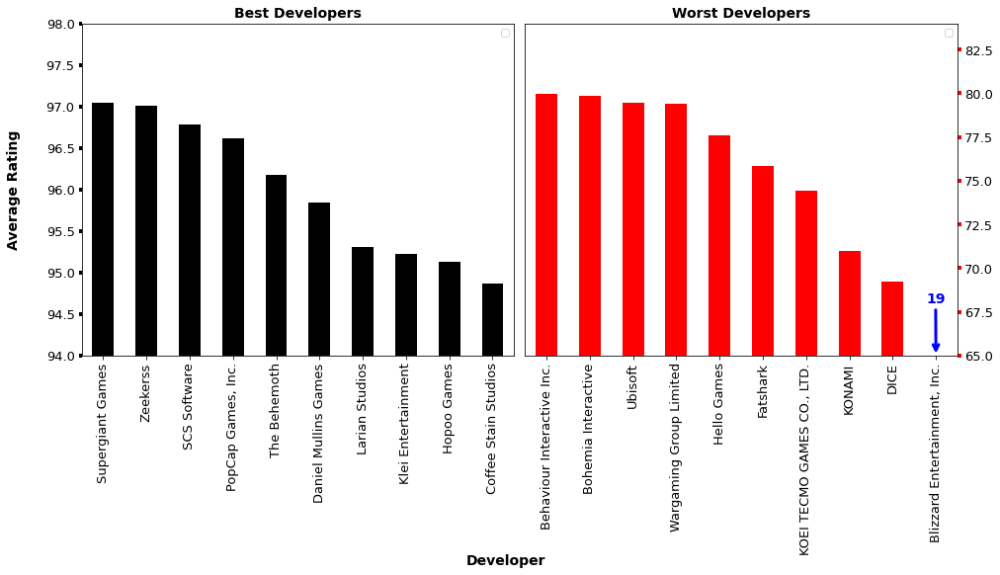

In [6]:
# Best and worst developers

# Grouping by developers
devs_df = df.explode('developer').reset_index()
devs_df = devs_df.groupby('developer').aggregate(av_price = ('price', 'mean'), av_rating = ('numberof_positive_reviews', 'sum'), count = ('price', 'count'), total_reviews = ('number_of_reviews', 'sum')).reset_index().round(2)

# Getting the average rating for each one and ordering
devs_df['av_rating'] = devs_df['av_rating']/devs_df['total_reviews']
devs_df = devs_df.sort_values(by=['av_rating'], ascending=False)

# Selecting only devs which have at least 3 published games, with at least 100k reviews total
big_devs_df = devs_df[(devs_df['count']>2) & (devs_df['total_reviews']>100000)].reset_index()

# Getting the best devs
top_devs = big_devs_df[:10]

# Getting the worst devs
bottom_devs = big_devs_df.tail(9)

# Workaround to make an exception for Blizzard, which has an astounding bad rating with 200k+ reviews
bottom_devs = bottom_devs.append(devs_df[(devs_df['total_reviews']>100000)].sort_values(by=['av_rating'], ascending = False).tail(1))

# Creating barplot for the best and the worst devs
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(14, 8))


# Bar plot for the top devs
top_devs.plot.bar(x='developer', y='av_rating', width=0.5, color='k', ax=axis[0])
axis[0].set_ylim(94, 98)
axis[0].set_title('Best Developers', fontsize=14, fontweight='bold')
axis[0].set_xlabel('')
axis[0].set_ylabel('Average Rating', fontsize=14, fontweight='bold')
axis[0].yaxis.set_label_coords(-.14, .5)
axis[0].tick_params(axis='x', labelsize=13)
axis[0].tick_params(axis='y', width=4, labelsize=13)
axis[0].legend('')

# Bar plot for the bottom devs
bottom_devs.plot.bar(x='developer', y='av_rating', width=0.5, color='red', ax=axis[1])
axis[1].set_ylim(65, 84)
axis[1].set_title('Worst Developers', fontsize=14, fontweight='bold')
axis[1].set_xlabel('')
axis[1].set_ylabel('')
axis[1].yaxis.tick_right()
axis[1].tick_params(axis='x', labelsize=13)
axis[1].tick_params(axis = 'y', color='red', width=4, labelsize=13)
axis[1].legend('')
axis[1].annotate('19', xy=(9, 65), xytext=(8.77, 68), arrowprops=dict(arrowstyle='->', color='blue', lw=3), color='blue', fontsize=14, weight='bold')

fig.text(0.5, 0.0, 'Developer', ha='center', fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


### Best and worst big publishers <a class="anchor" id="pubs"></a>

Now, we move on to the best and the worst **Publishers** on Steam. Once more, only publishers which have **at least** 3 released games, with a minimum total of 100k reviews are considered. I again make an exception for Blizzard, bearing their impressive score of 19% positive reviews. Their score as a publisher is the same as that of developers, due to the fact that they serve as both developers and publishers for the games they produce. This time it's Activision Blizzard that manages the feat of appearing not only once, but twice as worst developers, both as Activision, and as Blizzard.

Moreover, we once again observe that the relatively smaller studios populate the top 10. Perhaps triple A games generate bigger expectations, which in turn sets up for bigger disappointments. Furthermore, we see that many of the top publishers also appeared as top developers, meaning they act as both developers and publishers. A plausible justification would be that independent studios have more freedom in their projects, and consequently more room to experiment, once they are not bound by the conforms of a specific publisher.

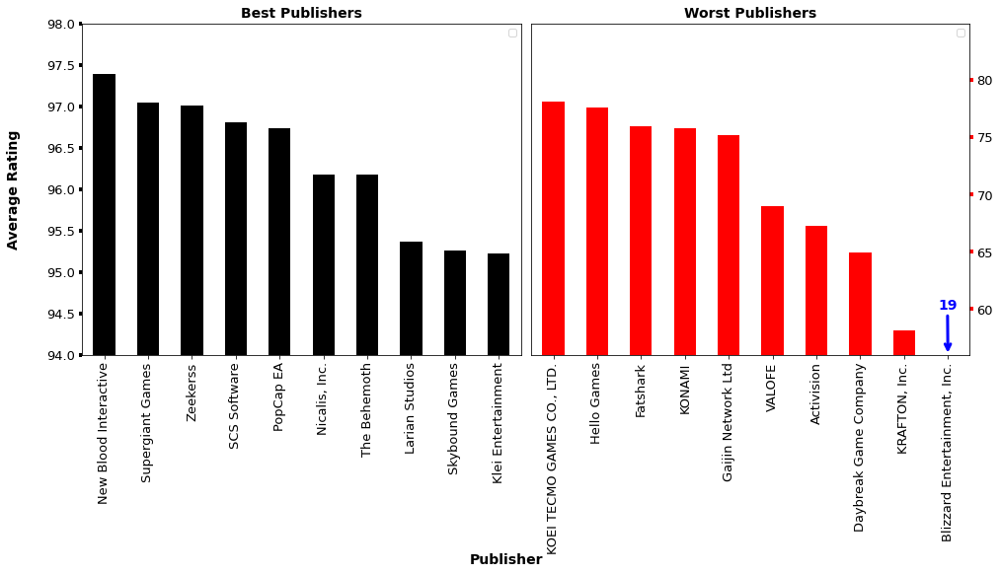

In [7]:
# Best and worst publishers

# Grouping by publishers
pubs_df = df.explode('publisher').reset_index()
pubs_df = pubs_df.groupby('publisher').aggregate(av_price = ('price', 'mean'), av_rating = ('numberof_positive_reviews', 'sum'), count = ('price', 'count'), total_reviews = ('number_of_reviews', 'sum')).reset_index().round(2)

# Getting the average rating for each one and ordering
pubs_df['av_rating'] = pubs_df['av_rating']/pubs_df['total_reviews']
pubs_df = pubs_df.sort_values(by=['av_rating'], ascending=False)

# Selecting only publishers which have at least 3 published games, with at least 100k reviews total
big_pubs_df = pubs_df[(pubs_df['count']>2) & (pubs_df['total_reviews']>100000)].reset_index()

# Getting the best publishers
top_pubs = big_pubs_df[:10]
pd.options.mode.chained_assignment = None
top_pubs.loc[top_pubs['publisher'].str.contains('PopCap Games'), 'publisher'] = 'PopCap EA'

# Getting the worst publishers
bottom_pubs = big_pubs_df.tail(9)

# Workaround to make an exception for Blizzard again, which has an astounding bad rating with 200k+ reviews
bottom_pubs = bottom_pubs.append(pubs_df[(pubs_df['total_reviews']>100000)].sort_values(by=['av_rating'], ascending = False).tail(1))

# Creating barplot for the best and the worst pubs
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(14, 8))


# Bar plot for the top devs
top_pubs.plot.bar(x='publisher', y='av_rating', width=0.5, color='k', ax=axis[0])
axis[0].set_ylim(94, 98)
axis[0].set_title('Best Publishers', fontsize=14, fontweight='bold')
axis[0].set_xlabel('')
axis[0].set_ylabel('Average Rating', fontsize=14, fontweight='bold')
axis[0].yaxis.set_label_coords(-.14, .5)
axis[0].tick_params(axis='x', labelsize=13)
axis[0].tick_params(axis='y', width=4, labelsize=13)
axis[0].legend('')

# Bar plot for the bottom devs
bottom_pubs.plot.bar(x='publisher', y='av_rating', width=0.5, color='red', ax=axis[1])
axis[1].set_ylim(56, 84.9)
axis[1].set_title('Worst Publishers', fontsize=14, fontweight='bold')
axis[1].set_xlabel('')
axis[1].set_ylabel('')
axis[1].yaxis.tick_right()
axis[1].tick_params(axis='x', labelsize=13)
axis[1].tick_params(axis = 'y', color='red', width=4, labelsize=13)
axis[1].legend('')
axis[1].annotate('19', xy=(9, 56), xytext=(8.77, 60), arrowprops=dict(arrowstyle='->', color='blue', lw=3), color='blue', fontsize=14, weight='bold')

fig.text(0.5, 0.0, 'Publisher', ha='center', fontsize=14, fontweight='bold')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

### Most played genres <a class="anchor" id="genres"></a>

We now take a look at the most played genres on steam, as well as their average price. For this analysis, I only considered the first $5$ tags on each game, as many of them simply include as many tags as possible so as to show up in more searches. As expected, the "Indie" tag emerges as the most prevalent genre, reflecting the robust presence of independently developed games on the platform. This is a reflect of the increased accessibility of digital distribution platforms like Steam, that have democratized game development, allowing indie developers to create and distribute their games without the need for extensive resources or support from traditional publishers. Furthermore, the rise of these digital storefronts has provided indie games with unparalleled exposure and visibility.

As for the prices, we observe that games associated with more robust, expansive experiences, such as RPGs, tend to present higher price points. These games typically offer longer gameplay durations and a wealth of content, ranging from side quests to character progression systems. Consequently, developers may opt to set higher price points for RPGs to reflect the value and depth of gameplay they provide, as well as to ensure sustainability and profitability in an increasingly competitive market.

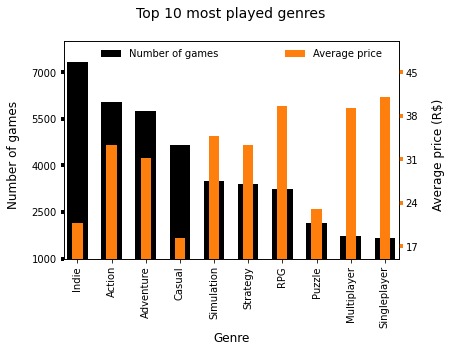

In [8]:
# df tags with the number of occurrence of each tag, as well as its average price
exploded_tags_df = df.explode('tags').reset_index()
tags = exploded_tags_df.groupby('tags').aggregate(av_price = ('price', 'mean'), av_rating = ('positive_percent', 'mean'), count = ('price', 'count')).sort_values(by=['count'], ascending=False).reset_index().round(2)
top_tags = tags[:10]


# Bar plot for the number of times each genre appears
ax = top_tags.plot.bar(x='tags', y='count', width = .6, color='k', label='Number of games')

ax2 = ax.twinx()

# Bar plot for the average price of each game
ax2 = top_tags.plot.bar(x='tags', y='av_price', width = .3, color='C1', ax=ax2, label = 'Average price')

#Adjusting labels
plt.title('Top 10 most played genres', size=14, y=1.08)
ax.set_xlabel('Genre', size=12)
ax.set_ylabel('Number of games', size=12)
ax.tick_params(axis = 'y', color='k', which='both', width=4)
ax2.set_ylabel('Average price (R$)', size=12)
ax2.tick_params(color='C1', which='both', width=4)
ax.set_ylim(1000, 8000)
ax.set_yticks(np.arange(1000, 8000, 1500))
ax2.set_yticks(np.arange(10, 50, 7))
ax2.set_ylim(15, 50)
ax.yaxis.set_label_coords(-0.13, 0.48)
ax2.yaxis.set_label_coords(1.1, 0.48)
ax.legend(loc=(.1, .9), frameon=False)
ax2.legend(loc=(.65, .9), frameon=False)


plt.show()

### Steam's released games along the years <a class="anchor" id="year_releases"></a>

As a little extra, we can investigate the number of released game each year, along with their average pricing as of **today**. Even though a game's Steam page contains its price, it does not contain its price history, so we can not compare the average price of released games along the year, only as they are now. Firstly, only games with at least $50$ total reviews were considered for the following figure. The plot shows an almost monotonic crescent quantity of games each year, with the most recent entry, 2023, averaging approximately $7$ new games **a day**.

As for the pricing, it's a bit more complicated. If we look at the early 2010s, there are considerably fewer games, and their average cost is significantly higher than the mid 2010s. This can be attributed to factors such as higher demand and games being more fleshed out. Then, as Steam's notoriaty surged, with it came an explosion in game releases, leading to a significant drop in prices. However, more recently, despite the continued influx of new games, there has been a decline in indie game production, which tend to be priced lower. Consequently, this has driven up the average price of games. Another crucial factor to consider is that game prices are often readjusted over time, further influencing the average pricing trends observed on Steam.

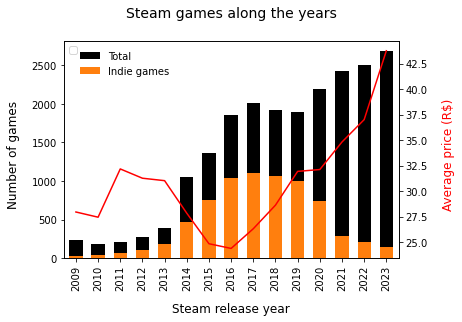

In [9]:
# Lineplot of av. price for games each year
year_prices = df.groupby('release_year').agg(av_year_price = ('price', 'mean'), count = ('price', 'count'), total_reviews = ('number_of_reviews', 'sum')).sort_values(by=['release_year'], ascending=True).reset_index().round(2)
# Only years with at least 50 entries to get a decent average
year_prices = year_prices[(year_prices['count'] > 180)][:-1]

# Bar plot for the number of games released each year
ax = year_prices.plot.bar(x='release_year', y='count', width=0.6, color='k', label='Total')
# Adjusting labels for the bar plot
ax.set_ylabel('Number of games', color='k', size=12)
ax.yaxis.set_label_coords(-0.13, 0.48)

# Creating a twin axis for the line plot
ax2 = ax.twinx()

# Plotting the line plot on the twin axis
year_prices.plot.line(x='release_year', y='av_year_price', color='r', ax=ax2)
# Adjusting labels for the line plot
ax2.set_ylabel('Average price (R$)', color='r', size=12)
ax2.yaxis.set_label_coords(1.13, 0.48)
ax2.legend('')

# Creating df with only Indies grouped by year
indies_year = exploded_tags_df[exploded_tags_df['tags'] == 'Indie'].groupby('release_year').agg(count = ('price', 'count')).reset_index()
# Matching the amount of entries with total amount of games
indies_year = indies_year[5:-1]

# Bar plot for the number of indie games each year 
ax3 = indies_year.plot.bar(x='release_year', y='count', width=0.6, color='C1', ax=ax, stacked=True, label='Indie games')
# Adjusting labels
ax.set_xlabel('Steam release year', size=12)
ax3.xaxis.set_label_coords(.5, -.2)
ax3.legend(loc=(.036, .82), frameon=False)

plt.title('Steam games along the years', size=14, y=1.08)

# Show the plot
plt.show()


### The impact innovative games have on the industry <a class="anchor" id="dark_souls"></a>

While on the topic of game genres, an intriguing aspect we can infer from the data is the popularity of specific genres over the years. Let's take a closer look at a particularly noteworthy example: the Souls-like genre.

The seminal title that defined the Souls-like genre was Dark Souls, released in September 2011. This version, however, is no longer available on the Steam store, being instead replaced by its remastered version, which released in May, 2018. Consequently, Dark Souls 2 now holds the distinction of being the oldest Souls-like game available on the Steam store, with no games bearing the Souls-like tag preceding it. Examining the following graph, we can observe the profound impact Dark Souls had on the gaming industry. Its release marked the beginning of a surge in what are now known as Souls-likes – games that draw inspiration from Dark Souls and seek to replicate its success.

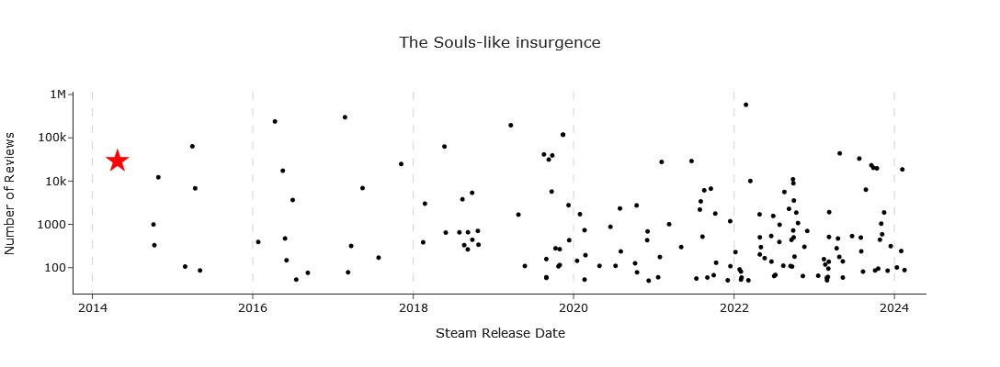

In [10]:
def create_plotly_trace(df, color, marker, size):
    trace = go.Scatter(
        x=df['release_date'],
        y=df['number_of_reviews'],
        mode='markers',
        marker=dict(symbol=marker, color=color, size=size),
        text= '<b>Game:</b> ' + df['app_name'] +\
                '<br><b>Rating:</b> ' + df['positive_percent'].map(lambda x: '{:d}'.format(int(x))) +\
                '<br><b>Price:</b> R$ ' + df['price'].map('{:.2f}'.format),                                      
        hoverinfo='text',
        showlegend=False
    )
    return trace

def create_plotly_layout(df, title, xaxis_title, initial_date=None, final_date=None):
    if (initial_date==None) or (final_date==None):
        date_range=[df['release_date'].min()-timedelta(days=200), df['release_date'].max()+timedelta(days=100)]
    else:
        date_range=[initial_date, final_date]
    layout = go.Layout(
        title=dict(text=title, y=0.9, x=0.5),
        xaxis=dict(
            title=xaxis_title,
            range=date_range,
            tickmode='linear',
            dtick='M24',  # Set major ticks every 2 years (24 months)
            showgrid=True,  # Show vertical grid lines
            griddash='dash',
            gridcolor='lightgray',  # Set color of grid lines
            zeroline=False  # Disable zero line
        ),
        height=400,  # Adjust height of the figure
        width=800,    # Adjust width of the figure
        yaxis=dict(title='Number of Reviews', type='log'),
        template='simple_white',
        hoverlabel=dict(bgcolor='white', font=dict(color='black')),
    )
    return layout


# Creating df and grouping by Souls-like tag
genre_name = 'Souls-like'
genre_df = exploded_tags_df[exploded_tags_df['tags'].str.contains(genre_name, na=False)]
genre_df = genre_df.sort_values(by='release_date')

# df to be plotted
genre_trace = create_plotly_trace(genre_df, 'black', marker='circle', size=5)
dark_souls_trace = create_plotly_trace(genre_df.iloc[:1], 'red', marker='star', size=20)

# Calling the plotly function
fig_genre = go.Figure(data=[genre_trace, dark_souls_trace], layout=create_plotly_layout(genre_df, 'The Souls-like insurgence', 'Steam Release Date'))

# Show Plotly figures
fig_genre.show()


#### Try it yourself <a class="anchor" id="tiy"></a>

In order to facilitate the analysis, I've automated the following cell in such manner that one can simply specify a desired genre to be inspected, and input its name in genre_name. When executed, this next cell will generate an output much similar to the one above: a graph illustrating the evolution of the chosen game genre's popularity over the years. As an example, I left 'Battle Royale' chosen by default. Note that, by hovering over the plot points, you can view the name, the rating, and the price of the corresponding game. To customize the date range, simply uncomment the lines initializing initial_date and final_date by removing the '#' before them. Then, delete the 'None' argument within the create_plotly_layout function call.

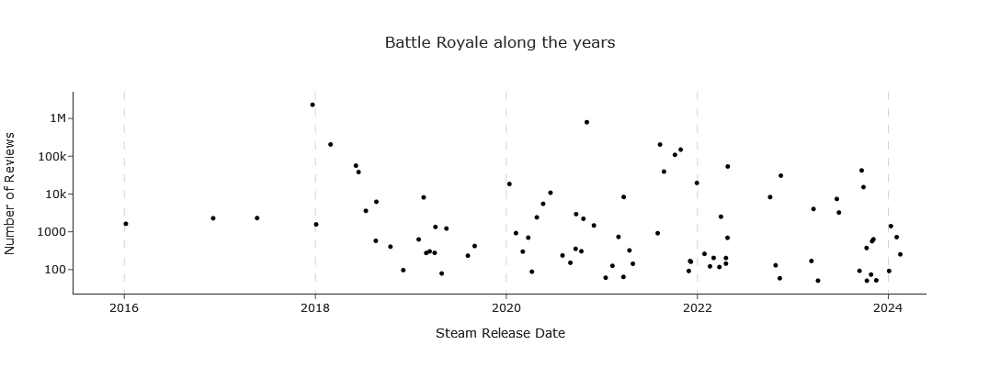

In [11]:
# Choosing genre name
genre_name = 'Battle Royale'

# Choosing desired interval. If not specified, date_range=[df['release_date'].min()-timedelta(days=200), df['release_date'].max()+timedelta(days=100)]
#initial_date = datetime(2010, 1, 1)
#final_date = datetime(2024, 3, 1)

genre_df = exploded_tags_df[exploded_tags_df['tags'].str.contains(genre_name, na=False)]
genre_df = genre_df.sort_values(by='release_date')

genre_trace = create_plotly_trace(genre_df, 'black', marker='circle', size=5)

fig_genre = go.Figure(data=[genre_trace], layout=create_plotly_layout(genre_df, genre_name + ' along the years', 'Steam Release Date', initial_date=None, final_date=None))

fig_genre.show()

### A player's perspective vs. a critics' <a class="anchor" id="pvc"></a>

Another interesting information we can explore, is the disparity between a game's player rating and its Metascore, which represents the critical consensus for a game. The Metascore provides insight into how professional critics perceive a game's quality, while the player rating reflects the collective opinion of the gaming community. In the following figure, I illustrate the difference in scores for each game that has a stated Metascore on its Steam page. The zero line then corresponds to an entry where critics and players perfectly agree on the game's quality.

There are many reasons why these ratings might disagree. Players tend to give better ratings for meme games, which offer unique or humorous experiences, such as Shaq Fu for instance, where you play as the NBA star, Shaquille O'Neal, as he battle the forces of evil using, of course, kung fu. Additionally, games designed for specific niche audiences may receive lower Metascores due to their narrower appeal, despite performing well among their intended audience. 
By exploring the differences between player ratings and Metascores, we can gain valuable insights into how different segments of the gaming community perceive and evaluate games.

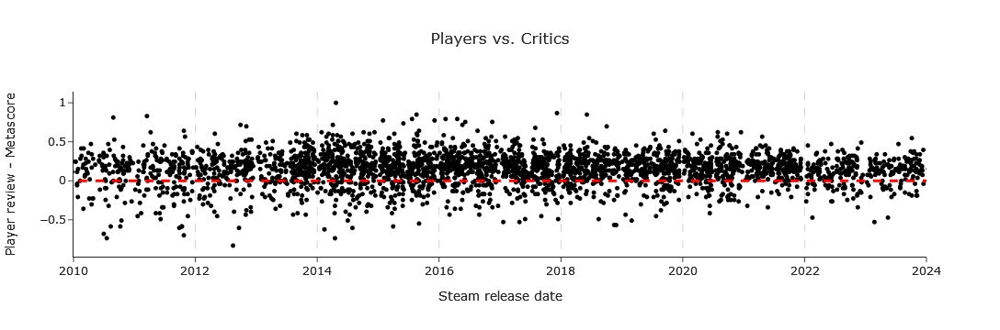

In [12]:
has_metascore = df[(~df['metascore'].isna())].reset_index(drop=True)
polemic_games = abs(has_metascore['positive_percent'] - has_metascore['metascore'])
max_entry = polemic_games.max()

trace = go.Scatter(
                y=(has_metascore['positive_percent']-has_metascore['metascore'])/max_entry,
                x=has_metascore['release_date'],
                mode='markers',
                marker=dict(color='black', size=5),
                text =  '<b>Game:</b> ' + has_metascore['app_name'] + \
                        '<br><b>Rating:</b> ' + has_metascore['positive_percent'].map(lambda x: '{:d}'.format(int(x))) +\
                        '<br><b>Metascore:</b> ' + has_metascore['metascore'].map(lambda x: '{:d}'.format(int(x))) +\
                        '<br><b>Price: </b>' + \
                            has_metascore.apply(lambda row: "Alternative payment method" if row['price'] == -1.0 else 'R$ {:.2f}'.format(row['price']), axis=1),
            hoverinfo='text',
            showlegend=False                                                                                    
)

zero_line = go.Scatter(
    x=[has_metascore['release_date'].min(), has_metascore['release_date'].max()],
    y=[0, 0],
    mode='lines',
    line=dict(color='red', dash='dash', width=3),
    name='y=0',
    showlegend=False
)

# Create Plotly layout
layout = go.Layout(
    title=dict(text="Players vs. Critics", y=0.9, x=0.5),
    xaxis=dict(title='Steam release date',
        range=[datetime(2010, 1, 1), datetime(2024, 1, 1)],
        tickmode='linear',
        dtick='M24',  # Set major ticks every 2 years (24 months)
        showgrid=True,  # Show vertical grid lines
        griddash='dash',
        gridcolor='lightgray',  # Set color of grid lines
        zeroline=False  # Disable zero line
    ),
    yaxis=dict(title='Player review - Metascore'),
    template='simple_white',
    hoverlabel=dict(bgcolor='white', font={'color':'black'})
)

# Create Plotly figure
fig = go.Figure(data=[trace, zero_line], layout=layout)

# Show Plotly figure
fig.show()

### Best and worst games <a class="anchor" id="games"></a>

Ending on a high note, we explore the best and the worst reviewed games on Steam. This time, every game with at least 30k reviews was considered. Additionally, games with the same ratings were ranked based on their total number of reviews. Under these criteria, it's Stardew Valley that takes the cake. The indie darling boasts 500k+ reviews, with an impressive rating of $98$. 
While Valve may not claim the top spot, it certainly doesn't disappoint, with three of its games securing spots in the top $10$. Valve isn't alone in this achievement, however, as Activision Blizzard also manages to secure three games on the list. Unfortunately, there seems to have been some confusion, as Activision Blizzard unintentionally dominates the top 10 worst-rated games on Steam, with Overwatch 2 taking the dubious honor of first (or last) place.

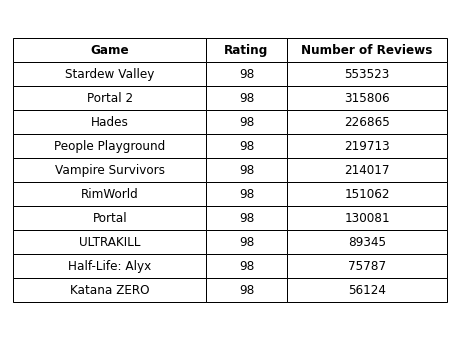

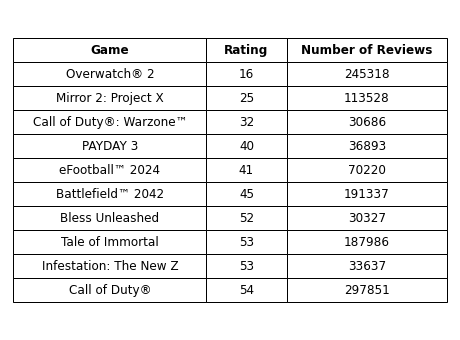

In [13]:
best_rated_games = df[(df['number_of_reviews']>30000)]
worst_rated_games = best_rated_games.sort_values(by=['positive_percent', 'number_of_reviews'], ascending=[True, False]).reset_index()[:10]
best_rated_games = best_rated_games.sort_values(by=['positive_percent', 'number_of_reviews'], ascending=False).reset_index()[:10]
worst_rated_games.loc[worst_rated_games['app_name'].str.contains('Immortal'), 'app_name'] = 'Tale of Immortal'

def plot_table(dataframe, selected_columns, column_labels):
    # Plotting the table
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.axis('tight')
    ax.axis('off')
    table = ax.table(cellText=dataframe[selected_columns].values, 
                     colLabels=column_labels,
                     colWidths=column_widths,
                     loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(14)
    table.scale(1.8, 2)  # Adjust scaling for vertical spacing

    # Centering text in each cell
    for key, cell in table.get_celld().items():
        if key[0] == 0:
             cell.set_text_props(fontproperties=FontProperties(weight='bold'))
        cell.set_text_props(fontsize=12, ha='center', va='center')  # Adjust fontsize as needed

    plt.show()

# Assuming worst_rated_games and best_rated_games are your DataFrames
selected_columns = ['app_name', 'positive_percent', 'number_of_reviews']
column_labels = ['Game', 'Rating', 'Number of Reviews']
column_widths = [0.24, 0.1, 0.2]

# Plotting tables for worst_rated_games and best_rated_games
plot_table(best_rated_games, selected_columns, column_labels)
plot_table(worst_rated_games, selected_columns, column_labels)